**STEP 1: Data Generation Function**

Creating synthetic insurance dataset

In [ ]:
import pandas as pd
import numpy as np
from sklearn.datasets import make_classification
from sklearn.preprocessing import MinMaxScaler
from scipy import stats
from sklearn.datasets import *
from sklearn.metrics import cohen_kappa_score, accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, roc_auc_score, confusion_matrix, log_loss, roc_curve
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns
import string
import shap

#Seed
np.random.seed(1889)

def collect_from_database(query: str) -> pd.DataFrame:
    print(f"Executing: {query}")
    n_rows = 10_000
    n_features = 16
    features, labels = make_classification(
        n_samples = n_rows,
        n_features = 16,
        n_informative = 7,
        n_redundant = 4,
        n_repeated = 3,
        n_classes = 2,
        class_sep = 1.2,
        flip_y = 0.035, # Randomly invert y for added noise
        weights = [0.85,0.15],
        random_state = 1889,
    )
    df = pd.DataFrame(features, columns=[f'numeric_{i+1}' for i in range(n_features)])
    df.insert(value=labels, loc=0, column='claim_status')
    df = df.rename(columns={
        'numeric_1': 'age',
        'numeric_2': 'height_cm',
        'numeric_3': 'weight_kg',
        'numeric_4': 'income',
        'numeric_5': 'financial_hist_1',
        'numeric_6': 'financial_hist_2',
        'numeric_7': 'financial_hist_3',
        'numeric_8': 'financial_hist_4',
        'numeric_9': 'credit_score_1',
        'numeric_10': 'credit_score_2',
        'numeric_11': 'credit_score_3',
        'numeric_12': 'insurance_hist_1',
        'numeric_13': 'insurance_hist_2',
        'numeric_14': 'insurance_hist_3',
        'numeric_15': 'insurance_hist_4',
        'numeric_16': 'insurance_hist_5',
    })
    df['age'] = MinMaxScaler(feature_range=(18, 95)).fit_transform(df['age'].values[:, None])
    df['age'] = df['age'].astype('int')
    df['height_cm'] = MinMaxScaler(feature_range=(140, 210)).fit_transform(df['height_cm'].values[:, None])
    df['height_cm'] = df['height_cm'].astype('int')
    df['weight_kg'] = MinMaxScaler(feature_range=(45, 125)).fit_transform(df['weight_kg'].values[:, None])
    df['weight_kg'] = df['weight_kg'].astype('int')
    df['income'] = MinMaxScaler(feature_range=(0, 250_000)).fit_transform(df['income'].values[:, None])
    df['income'] = df['income'].astype('int')
    df['credit_score_1'] = MinMaxScaler(feature_range=(0, 999)).fit_transform(df['credit_score_1'].values[:, None])
    df['credit_score_1'] = df['credit_score_1'].astype('int')
    df['credit_score_2'] = MinMaxScaler(feature_range=(0, 700)).fit_transform(df['credit_score_2'].values[:, None])
    df['credit_score_2'] = df['credit_score_2'].astype('int')
    df['credit_score_3'] = MinMaxScaler(feature_range=(0, 710)).fit_transform(df['credit_score_3'].values[:, None])
    df['credit_score_3'] = df['credit_score_3'].astype('int')
    df['bmi'] = (df['weight_kg']/((df['height_cm']/100)**2)).astype('int')
    df['gender'] = np.where(
        df['claim_status'] == 0,
        np.random.choice([1, 0], size=(n_rows), p=[0.46, 0.54]),
        np.random.choice([1, 0], size=(n_rows), p=[0.52, 0.48])
        )
    df['marital_status'] = np.random.choice(['A', 'B', 'C', 'D', 'E', 'F'], size=(n_rows), p=[0.2, 0.15, 0.1, 0.25, 0.15, 0.15])
    df['occupation'] = np.random.choice(['A', 'B', 'C', 'D', 'E', 'F', 'G'], size=(n_rows))
    df['location'] = np.random.choice(list(string.ascii_uppercase), size=(n_rows))
    df['prev_claim_rejected'] = np.where(
        df['claim_status'] == 0,
        np.random.choice([1, 0], size=(n_rows), p=[0.08, 0.92]),
        np.random.choice([1, 0], size=(n_rows), p=[0.16, 0.84])
        )
    df['known_health_conditions'] = np.random.choice([1, 0], size=(n_rows), p=[0.06, 0.94])
    df['uk_residence'] = np.random.choice([1, 0], size=(n_rows), p=[0.76, 0.24])
    df['family_history_1'] = np.random.choice([1, 0], size=(n_rows), p=[0.22, 0.78])
    df['family_history_2'] = np.random.choice([1, 0], size=(n_rows), p=[0.25, 0.75])
    df['family_history_3'] = np.random.choice([1, None, 0], size=(n_rows), p=[0.12, 0.81, 0.07])
    df['family_history_4'] = np.random.choice([1, 0], size=(n_rows), p=[0.27, 0.73])
    df['family_history_5'] = np.random.choice([1, 0], size=(n_rows), p=[0.31, 0.69])
    df['product_var_1'] = np.random.choice([1, 0], size=(n_rows), p=[0.38, 0.62])
    df['product_var_2'] = np.random.choice([1, 0], size=(n_rows), p=[0.55, 0.45])
    df['product_var_3'] = np.random.choice(['A', 'B', 'C', 'D'], size=(n_rows), p=[0.23, 0.28, 0.31, 0.18])
    df['product_var_4'] = np.random.choice([1, 0], size=(n_rows), p=[0.76, 0.24])
    df['health_status'] = np.random.randint(1, 5, size=(n_rows))
    df['driving_record'] = np.random.randint(1, 5, size=(n_rows))
    df['previous_claim_rate'] = np.where(
        df['claim_status'] == 0,
        np.random.choice([1, 2, 3, 4, 5], size=(n_rows), p=[0.48, 0.29, 0.12, 0.08, 0.03]),
        np.random.choice([1, 2, 3, 4, 5], size=(n_rows), p=[0.12, 0.28, 0.34, 0.19, 0.07]),
    )
    df['education_level'] = np.random.randint(0, 7, size=(n_rows))
    df['income level'] = pd.cut(df['income'], bins=5, labels=False, include_lowest=True)
    df['n_dependents'] = np.random.choice(
        [1, 2, 3, 4, 5], size=(n_rows), p=[0.23, 0.32, 0.27, 0.11, 0.07]
    )
    df['employment_type'] = np.random.choice(
        [1, None, 0], size=(n_rows), p=[0.16, 0.7, 0.14]
    )
    return df

In [ ]:
account_name = "rg_data_sci"
client_id = "a1b2c3d4"
client_secret = "b1c2d3e4" #Delete before commiting to ADO!!!
subscription_id = "8a7b6c5d"
tenant_id = "6f5g4h3i"
datalake_name = "rg_data_lake"
dataset_from_database = collect_from_database(
    "SELECT * FROM CLAIMS.DS_DATASET"
)
dataset_from_database.head(10)

Executing: SELECT * FROM CLAIMS.DS_DATASET


,claim_status,age,height_cm,weight_kg,income,financial_hist_1,financial_hist_2,financial_hist_3,financial_hist_4,credit_score_1,...,product_var_2,product_var_3,product_var_4,health_status,driving_record,previous_claim_rate,education_level,income level,n_dependents,employment_type
0,0,49,182,80,155292,1.408797,-0.573517,-0.464914,3.249624,519,...,0,A,0,3,2,1,2,3,1,0
1,0,55,185,86,169232,2.402368,1.135213,0.780797,3.075214,500,...,1,C,1,2,4,3,2,3,2,None
2,0,55,169,82,173856,-1.182139,0.337877,1.754185,1.932426,422,...,0,C,1,4,1,1,2,3,2,1
3,0,43,179,76,150264,1.107481,-1.123652,1.966727,-0.130857,297,...,1,D,1,4,1,1,0,3,2,None
4,0,56,167,86,118449,-0.985055,-0.604696,-0.650367,-1.329931,440,...,1,B,1,3,3,1,0,2,1,None
5,0,47,184,89,147966,-0.532343,1.668309,1.672834,1.083610,423,...,1,B,1,2,3,1,3,2,5,None
6,0,58,161,64,124218,-1.594298,-0.059563,-2.565507,-1.216361,392,...,0,A,1,2,1,1,2,2,3,None
7,0,55,170,96,109517,-0.867955,-1.461820,-0.543154,-1.298344,430,...,0,A,1,1,3,1,5,2,2,0
8,0,55,166,87,182091,-2.868900,-0.193578,2.230964,2.590524,349,...,0,D,1,1,2,2,5,3,3,1
9,0,52,166,78,171201,-2.935281,1.091528,1.392789,2.102653,417,...,1,B,0,1,2,1,5,3,5,None


**Data Type Inspection & Column Cleanup**

In [ ]:
total = dataset_from_database.isnull().sum()
percent = (dataset_from_database.isnull().sum() / dataset_from_database.isnull().count()*100)
missing_df = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
types = []
for col in dataset_from_database.columns:
    dtype = str(dataset_from_database[col].dtype)
    types.append(dtype)
missing_df['Types'] = types
dataset_from_database_no_missing_values = pd.DataFrame()
dataset_from_database_no_missing_values = dataset_from_database.drop(columns=['family_history_3', 'employment_type'])
dataset_from_database.drop(columns=['family_history_3', 'employment_type'], inplace=True)

In [ ]:
for i in dataset_from_database.columns:
    print(f"Column: {i}, dtype: {dataset_from_database[i].dtype}")

Column: claim_status, dtype: int64
Column: age, dtype: int64
Column: height_cm, dtype: int64
Column: weight_kg, dtype: int64
Column: income, dtype: int64
Column: financial_hist_1, dtype: float64
Column: financial_hist_2, dtype: float64
Column: financial_hist_3, dtype: float64
Column: financial_hist_4, dtype: float64
Column: credit_score_1, dtype: int64
Column: credit_score_2, dtype: int64
Column: credit_score_3, dtype: int64
Column: insurance_hist_1, dtype: float64
Column: insurance_hist_2, dtype: float64
Column: insurance_hist_3, dtype: float64
Column: insurance_hist_4, dtype: float64
Column: insurance_hist_5, dtype: float64
Column: bmi, dtype: int64
Column: gender, dtype: int64
Column: marital_status, dtype: object
Column: occupation, dtype: object
Column: location, dtype: object
Column: prev_claim_rejected, dtype: int64
Column: known_health_conditions, dtype: int64
Column: uk_residence, dtype: int64
Column: family_history_1, dtype: int64
Column: family_history_2, dtype: int64
Column

**Correlation Analysis & Heatmap Visualization**

In [ ]:
non_numerical = ['gender', 'marital_status', 'occupation', 'location', 'prev_claim_rejected', 'known_health_conditions', 'uk_residence', 'family_history_1', 'family_history_2', 'family_history_4', 'family_history_5', 'product_var_1', 'product_var_2', 'product_var_3', 'health_status', 'driving_record', 'previous_claim_rate', 'education_level', 'income level', 'n_dependents']

for column in non_numerical:
    dataset_from_database[column] = dataset_from_database[column].astype('category')

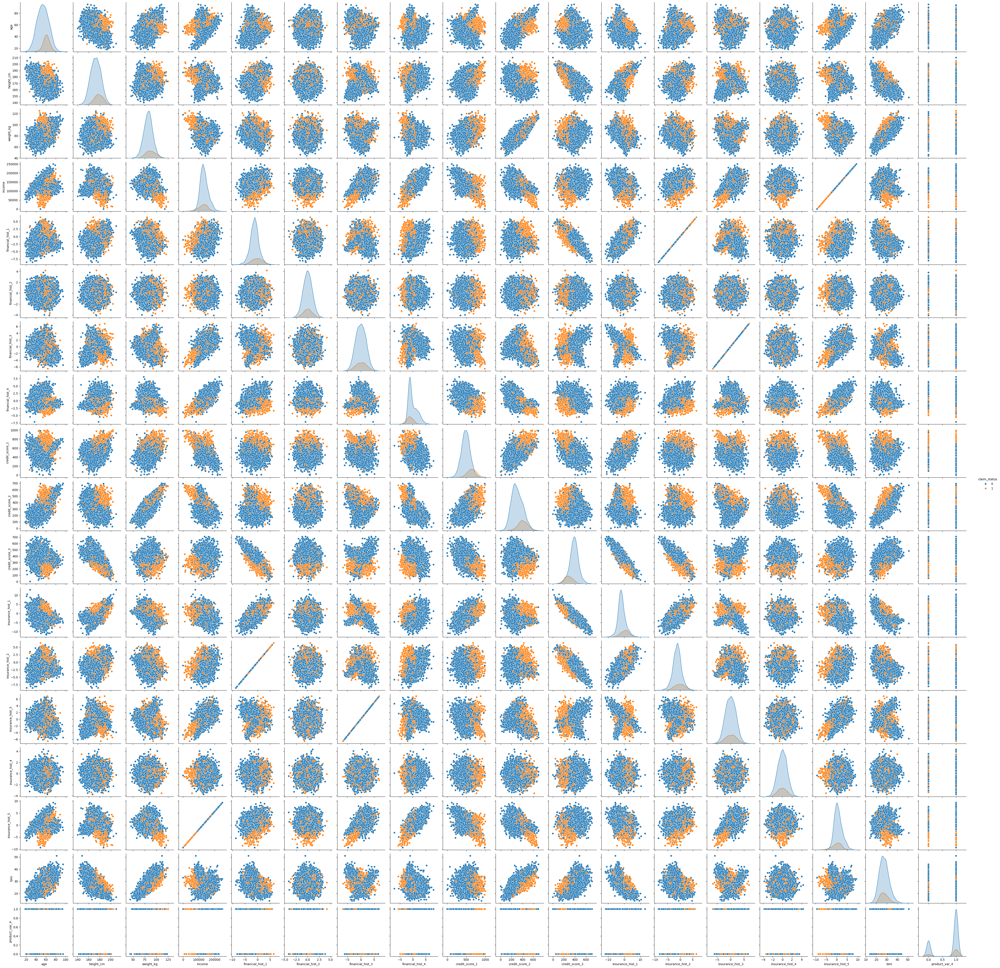

In [ ]:
sns.pairplot(dataset_from_database, hue='claim_status')

<Axes: >

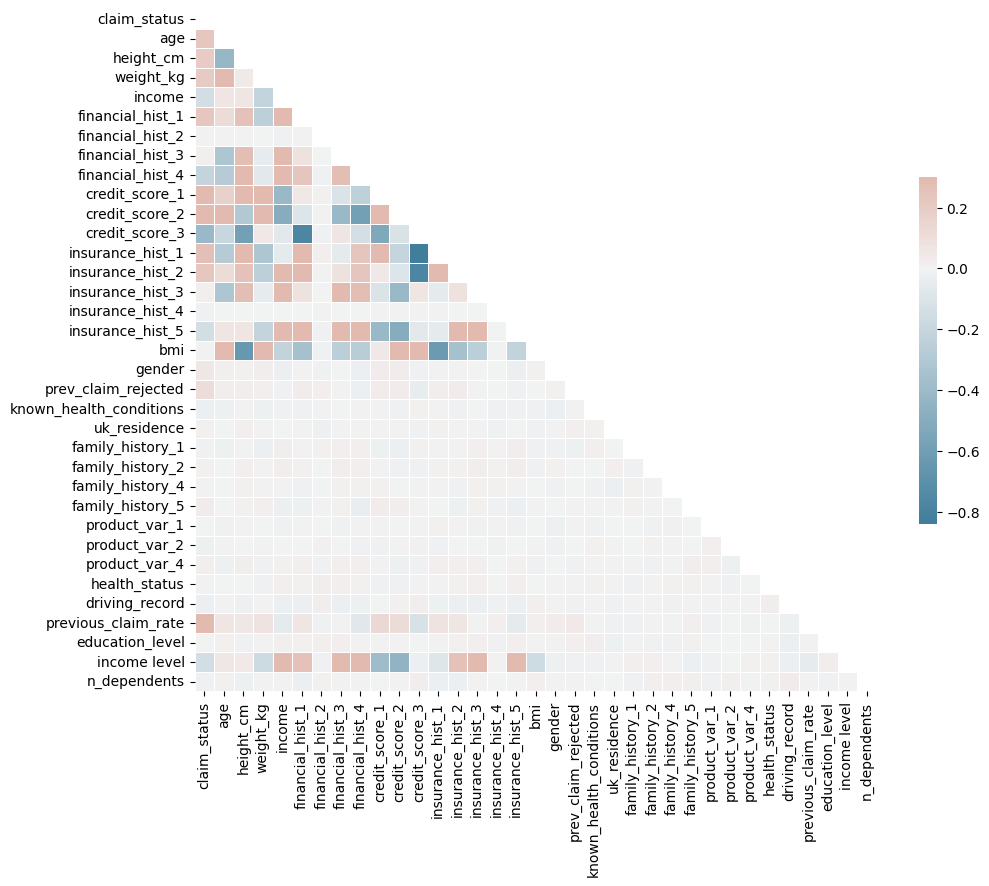

In [ ]:
corr = dataset_from_database[
    dataset_from_database.columns.drop(["product_var_3", "marital_status", "occupation", "location"])
].corr()
diag_mask = np.triu(np.ones_like(corr, dtype=bool))

# Create axes and colourmap
fig, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(
    corr,
    mask=diag_mask,
    cmap=cmap,
    vmax=0.3,
    center=0,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.5},
)

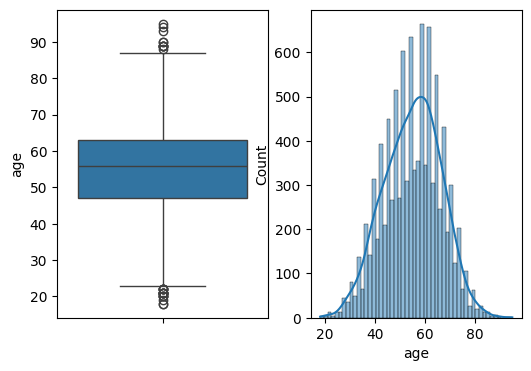

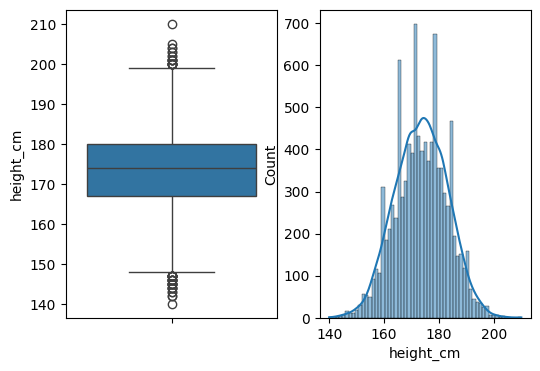

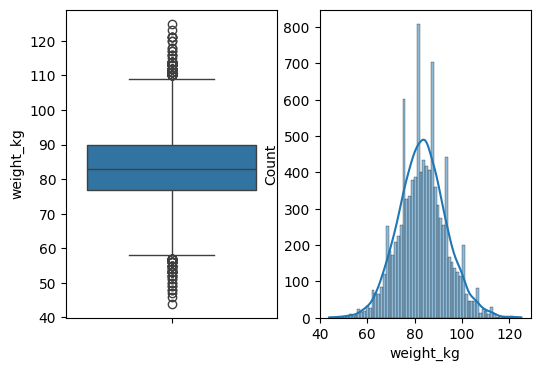

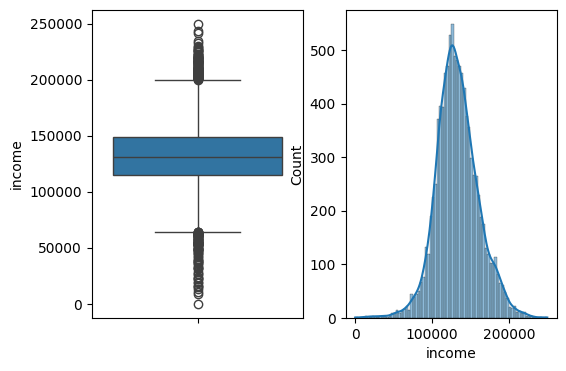

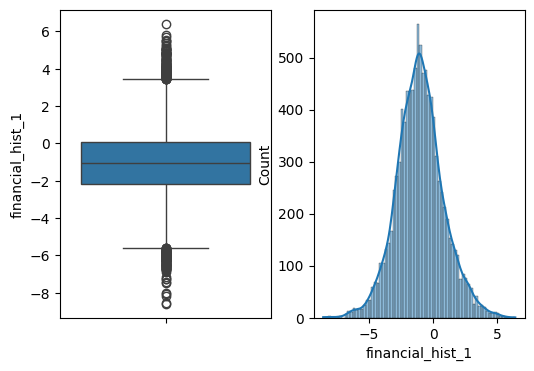

...

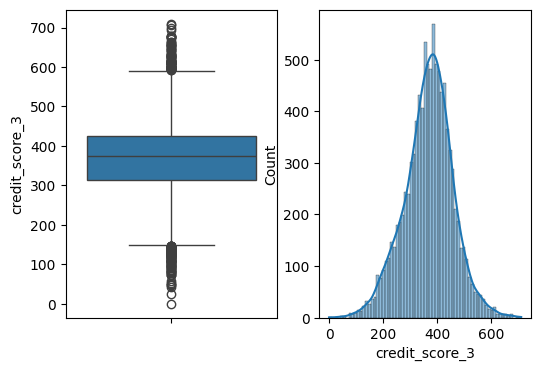

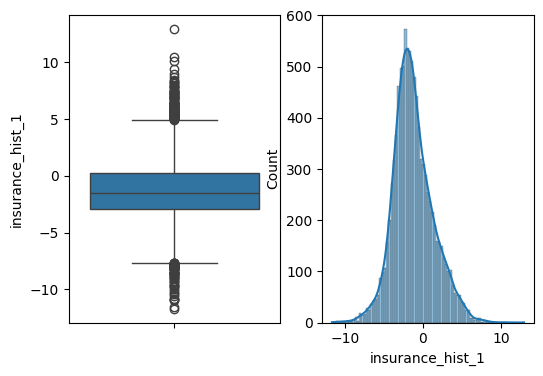

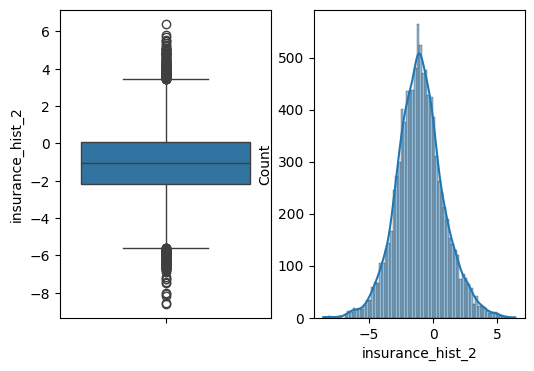

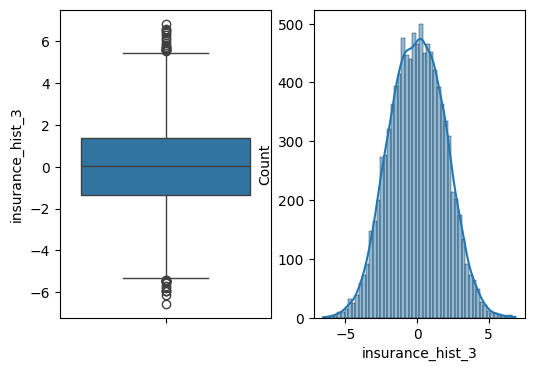

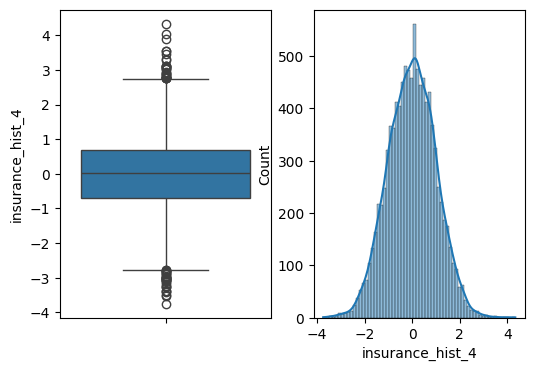

In [ ]:
for column in ['age', 'height_cm', 'weight_kg', 'income', 'financial_hist_1', 'financial_hist_2', 'financial_hist_3', 'financial_hist_4','credit_score_1', 'credit_score_2', 'credit_score_3', 'insurance_hist_1', 'insurance_hist_2', 'insurance_hist_3', 'insurance_hist_4']:
    fig, ax = plt.subplots(1, 2, figsize=(6,4))
    sns.boxplot(data=dataset_from_database, y = column, orient='v', ax=ax[0])
    sns.histplot(dataset_from_database, x = column, kde=True, ax=ax[1])

plt.show()

In [ ]:
column_plots = dataset_from_database.columns.drop(['claim_status', 'financial_hist_1', 'financial_hist_2', 'financial_hist_3', 'financial_hist_4',  'insurance_hist_1', 'insurance_hist_2', 'insurance_hist_3', 'insurance_hist_4', 'insurance_hist_5', 'income'])

**Train/Test Data Split & XGB Model Setup**

In [ ]:
# Separate the Dataframe into labels and features
X, y = dataset_from_database.drop('claim_status', axis=1), dataset_from_database[['claim_status']]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1889)

# Build the evaluation set & metric list
eval_set = [(X_train, y_train)]
eval_metrics = ['auc', 'rmse', 'logloss']

In [ ]:
# 1. First, ensure dropped columns are actually removed
print("Columns before cleaning:", X_train.columns.tolist())

# 2. Remove any remaining problematic columns
columns_to_drop = ['family_history_3', 'employment_type']
X_train = X_train.drop(columns=columns_to_drop, errors='ignore')
X_test = X_test.drop(columns=columns_to_drop, errors='ignore')

# 3. Convert remaining categorical columns properly
categorical_columns = ['gender', 'marital_status', 'occupation', 'location', 'prev_claim_rejected',
                      'known_health_conditions', 'uk_residence', 'family_history_1', 'family_history_2',
                      'family_history_4', 'family_history_5', 'product_var_1', 'product_var_2',
                      'product_var_3', 'health_status', 'driving_record', 'previous_claim_rate',
                      'education_level', 'income level', 'n_dependents']

for col in categorical_columns:
    if col in X_train.columns:
        X_train[col] = X_train[col].astype('category')
        X_test[col] = X_test[col].astype('category')

# 4. Also fix y_train (remove extra brackets)
y_train = y_train.squeeze()  # Convert from DataFrame to Series
y_test = y_test.squeeze()

# 5. Update eval_set
eval_set = [(X_train, y_train)]

# 6. Now train the model
model = xgb.XGBClassifier(
    objective='binary:logistic',
    eval_metric=eval_metrics,
    enable_categorical=True
)

model.fit(X_train, y_train, eval_set=eval_set, verbose=10)

Columns before cleaning: ['age', 'height_cm', 'weight_kg', 'income', 'financial_hist_1', 'financial_hist_2', 'financial_hist_3', 'financial_hist_4', 'credit_score_1', 'credit_score_2', 'credit_score_3', 'insurance_hist_1', 'insurance_hist_2', 'insurance_hist_3', 'insurance_hist_4', 'insurance_hist_5', 'bmi', 'gender', 'marital_status', 'occupation', 'location', 'prev_claim_rejected', 'known_health_conditions', 'uk_residence', 'family_history_1', 'family_history_2', 'family_history_4', 'family_history_5', 'product_var_1', 'product_var_2', 'product_var_3', 'product_var_4', 'health_status', 'driving_record', 'previous_claim_rate', 'education_level', 'income level', 'n_dependents']
[0]	validation_0-auc:0.95153	validation_0-rmse:0.29125	validation_0-logloss:0.31091
[10]	validation_0-auc:0.99157	validation_0-rmse:0.14790	validation_0-logloss:0.09523
[20]	validation_0-auc:0.99850	validation_0-rmse:0.10892	validation_0-logloss:0.05504
[30]	validation_0-auc:0.99987	validation_0-rmse:0.07815	val

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=True, eval_metric=['auc', 'rmse', 'logloss'],
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

**Model Evaluation & Performance Metrics**

TRAINING METRICS:
Accuracy: 1.0000
ROC-AUC: 1.0000

TEST METRICS:
Accuracy: 0.9630
Precision: 0.9573
Recall: 0.8127
F1-Score: 0.8791
ROC-AUC: 0.9613
Log Loss: 0.1630

Confusion Matrix:
[[1657   12]
 [  62  269]]


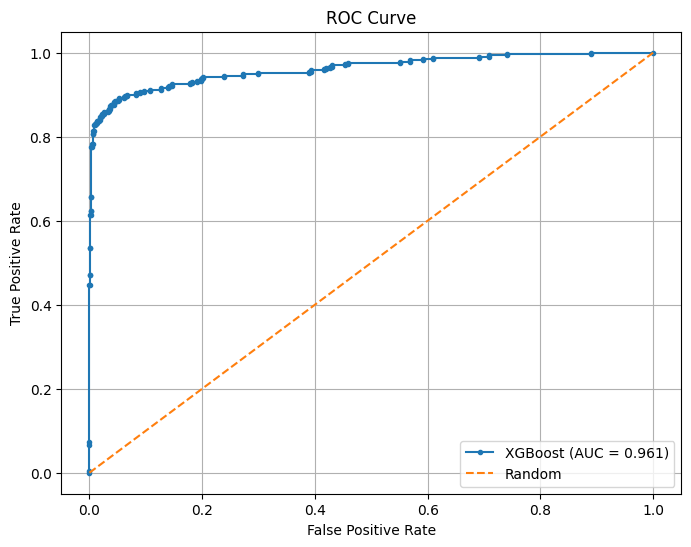

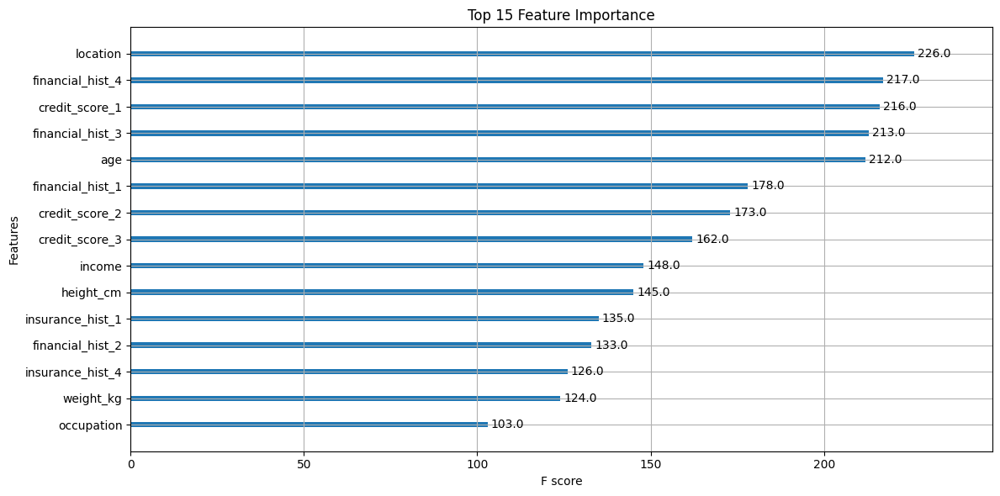

In [ ]:
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix, log_loss, roc_curve
)
import matplotlib.pyplot as plt

# Generate predictions
train_class_preds = model.predict(X_train)
test_class_preds = model.predict(X_test)
train_prob_preds = model.predict_proba(X_train)[:, 1]
test_prob_preds = model.predict_proba(X_test)[:, 1]

# Calculate metrics
print("TRAINING METRICS:")
print(f"Accuracy: {accuracy_score(y_train, train_class_preds):.4f}")
print(f"ROC-AUC: {roc_auc_score(y_train, train_prob_preds):.4f}")

print("\nTEST METRICS:")
print(f"Accuracy: {accuracy_score(y_test, test_class_preds):.4f}")
print(f"Precision: {precision_score(y_test, test_class_preds):.4f}")
print(f"Recall: {recall_score(y_test, test_class_preds):.4f}")
print(f"F1-Score: {f1_score(y_test, test_class_preds):.4f}")
print(f"ROC-AUC: {roc_auc_score(y_test, test_prob_preds):.4f}")
print(f"Log Loss: {log_loss(y_test, test_prob_preds):.4f}")

# Confusion Matrix
print(f"\nConfusion Matrix:\n{confusion_matrix(y_test, test_class_preds)}")

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, test_prob_preds)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', label=f'XGBoost (AUC = {roc_auc_score(y_test, test_prob_preds):.3f})')
plt.plot([0, 1], [0, 1], linestyle='--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.grid(True)
plt.show()

# Feature Importance
fig, ax = plt.subplots(figsize=(12, 6))
xgb.plot_importance(model, ax=ax, max_num_features=15)
plt.title('Top 15 Feature Importance')
plt.tight_layout()
plt.show()

**Production Pipeline Structure & Components**

In [ ]:
import joblib
import json
from datetime import datetime
import logging
from typing import List, Dict, Any, Union
import pandas as pd
import numpy as np

# 1. Model Management Class
class ModelManager:
    def __init__(self, model_path: str = "claims_prediction_model.json"):
        self.model_path = model_path
        self.model = None

    def save_model(self, model, metadata: Dict = None):
        """Save trained model with metadata"""
        model.save_model(self.model_path)

        if metadata:
            metadata_path = self.model_path.replace('.json', '_metadata.json')
            with open(metadata_path, 'w') as f:
                json.dump(metadata, f, indent=2)

        print(f"Model saved to: {self.model_path}")

    def load_model(self):
        """Load trained model"""
        self.model = xgb.XGBClassifier()
        self.model.load_model(self.model_path)
        print(f"Model loaded from: {self.model_path}")
        return self.model

# 2. Data Processing Class
class DataProcessor:
    def __init__(self):
        self.categorical_columns = [
            'gender', 'marital_status', 'occupation', 'location', 'prev_claim_rejected',
            'known_health_conditions', 'uk_residence', 'family_history_1', 'family_history_2',
            'family_history_4', 'family_history_5', 'product_var_1', 'product_var_2',
            'product_var_3', 'health_status', 'driving_record', 'previous_claim_rate',
            'education_level', 'income level', 'n_dependents'
        ]
        self.columns_to_drop = ['family_history_3', 'employment_type']

    def clean_data(self, df: pd.DataFrame) -> pd.DataFrame:
        """Clean and preprocess data"""
        df_clean = df.copy()

        # Drop problematic columns
        df_clean = df_clean.drop(columns=self.columns_to_drop, errors='ignore')

        # Convert categorical columns
        for col in self.categorical_columns:
            if col in df_clean.columns:
                df_clean[col] = df_clean[col].astype('category')

        return df_clean

    def prepare_for_training(self, df: pd.DataFrame):
        """Prepare data for model training"""
        df_processed = self.clean_data(df)

        X = df_processed.drop('claim_status', axis=1)
        y = df_processed['claim_status']

        return X, y

    def prepare_for_prediction(self, df: pd.DataFrame) -> pd.DataFrame:
        """Prepare data for prediction (no target column)"""
        return self.clean_data(df)

# 3. Claims Prediction Service
class ClaimsPredictionService:
    def __init__(self, model_path: str = "claims_prediction_model.json"):
        self.model_manager = ModelManager(model_path)
        self.data_processor = DataProcessor()
        self.model = self.model_manager.load_model()
        self.prediction_history = []

    def predict_single(self, application_data: Dict[str, Any]) -> Dict[str, Any]:
        """Predict claim likelihood for single application"""
        try:
            # Convert to DataFrame
            df = pd.DataFrame([application_data])

            # Process data
            df_processed = self.data_processor.prepare_for_prediction(df)

            # Make prediction
            probability = self.model.predict_proba(df_processed)[0, 1]
            prediction = self.model.predict(df_processed)[0]

            # Categorize risk
            risk_category = self._categorize_risk(probability)

            result = {
                'application_id': application_data.get('application_id', 'unknown'),
                'claim_probability': float(probability),
                'claim_prediction': int(prediction),
                'risk_category': risk_category,
                'timestamp': datetime.now().isoformat(),
                'processing_time_ms': 0  # Add timing if needed
            }

            self.prediction_history.append(result)
            return result

        except Exception as e:
            return {
                'error': str(e),
                'application_id': application_data.get('application_id', 'unknown'),
                'timestamp': datetime.now().isoformat()
            }

    def predict_batch(self, applications: List[Dict[str, Any]]) -> Dict[str, Any]:
        """Batch prediction for daily 1200 applications"""
        start_time = datetime.now()

        try:
            # Convert to DataFrame
            df = pd.DataFrame(applications)

            # Process data
            df_processed = self.data_processor.prepare_for_prediction(df)

            # Make batch predictions
            probabilities = self.model.predict_proba(df_processed)[:, 1]
            predictions = self.model.predict(df_processed)

            # Format results
            results = []
            for i, app in enumerate(applications):
                result = {
                    'application_id': app.get('application_id', f'batch_{i}'),
                    'claim_probability': float(probabilities[i]),
                    'claim_prediction': int(predictions[i]),
                    'risk_category': self._categorize_risk(probabilities[i]),
                    'timestamp': datetime.now().isoformat()
                }
                results.append(result)
                self.prediction_history.append(result)

            processing_time = (datetime.now() - start_time).total_seconds()

            return {
                'status': 'success',
                'total_processed': len(results),
                'processing_time_seconds': processing_time,
                'predictions': results,
                'summary': self._generate_batch_summary(results)
            }

        except Exception as e:
            return {
                'status': 'failed',
                'error': str(e),
                'processing_time_seconds': (datetime.now() - start_time).total_seconds()
            }

    def _categorize_risk(self, probability: float) -> str:
        """Categorize risk based on claim probability"""
        if probability >= 0.7:
            return "HIGH"
        elif probability >= 0.3:
            return "MEDIUM"
        else:
            return "LOW"

    def _generate_batch_summary(self, results: List[Dict]) -> Dict[str, Any]:
        """Generate summary statistics for batch"""
        probabilities = [r['claim_probability'] for r in results]
        risk_counts = {}
        for r in results:
            risk = r['risk_category']
            risk_counts[risk] = risk_counts.get(risk, 0) + 1

        return {
            'average_probability': np.mean(probabilities),
            'risk_distribution': risk_counts,
            'high_risk_count': risk_counts.get('HIGH', 0),
            'applications_flagged': sum(1 for r in results if r['risk_category'] == 'HIGH')
        }

# 4. Monthly Retraining Pipeline
class MonthlyRetrainingPipeline:
    def __init__(self):
        self.data_processor = DataProcessor()
        self.model_manager = ModelManager()

    def retrain_model(self, new_data: pd.DataFrame) -> Dict[str, Any]:
        """Monthly retraining with new data"""
        try:
            print("Starting monthly retraining...")

            # Process new data
            X, y = self.data_processor.prepare_for_training(new_data)

            # Split data
            X_train, X_test, y_train, y_test = train_test_split(
                X, y, test_size=0.2, random_state=1889
            )

            # Train new model
            new_model = xgb.XGBClassifier(
                objective='binary:logistic',
                eval_metric=['auc', 'rmse', 'logloss'],
                enable_categorical=True
            )

            new_model.fit(X_train, y_train, verbose=False)

            # Evaluate new model
            test_prob_preds = new_model.predict_proba(X_test)[:, 1]
            new_auc = roc_auc_score(y_test, test_prob_preds)

            # Save new model with metadata
            metadata = {
                'retrain_date': datetime.now().isoformat(),
                'data_shape': X.shape,
                'test_auc': float(new_auc),
                'model_version': f"v_{datetime.now().strftime('%Y%m%d')}"
            }

            model_path = f"claims_model_{datetime.now().strftime('%Y%m%d')}.json"
            self.model_manager.model_path = model_path
            self.model_manager.save_model(new_model, metadata)

            return {
                'status': 'success',
                'new_model_path': model_path,
                'test_auc': new_auc,
                'training_date': metadata['retrain_date']
            }

        except Exception as e:
            return {
                'status': 'failed',
                'error': str(e)
            }

# 5. Initialize Production Services
print("🚀 Initializing Production Pipeline...")

# Save current trained model
model_manager = ModelManager()
metadata = {
    'training_date': datetime.now().isoformat(),
    'model_type': 'initial_training',
    'test_auc': roc_auc_score(y_test, test_prob_preds)  # Use from your evaluation
}
model_manager.save_model(model, metadata)

# Initialize prediction service
prediction_service = ClaimsPredictionService()

print(" Production pipeline ready!")
print(" Model saved and loaded")
print(" Batch processing capability")

🚀 Initializing Production Pipeline...
Model saved to: claims_prediction_model.json
Model loaded from: claims_prediction_model.json
 Production pipeline ready!
 Model saved and loaded
 Batch processing capability


**Production Prediction Service - Single application predictions**

In [ ]:
# Fix: Create sample_application first
sample_application = {
    'application_id': 'APP_001',
    'age': 35,
    'height_cm': 175,
    'weight_kg': 70,
    'income': 50000,
    'bmi': 22,
    'gender': 1,
    'marital_status': 'A',
    'occupation': 'B',
    'location': 'C',
    'prev_claim_rejected': 0,
    'known_health_conditions': 0,
    'uk_residence': 1,
    'family_history_1': 0,
    'family_history_2': 0,
    'family_history_4': 0,
    'family_history_5': 0,
    'product_var_1': 1,
    'product_var_2': 0,
    'product_var_3': 'A',
    'product_var_4': 1,
    'health_status': 2,
    'driving_record': 1,
    'previous_claim_rate': 1,
    'education_level': 3,
    'income level': 2,
    'n_dependents': 2,
    'financial_hist_1': 0.1,
    'financial_hist_2': 0.2,
    'financial_hist_3': 0.15,
    'financial_hist_4': 0.3,
    'credit_score_1': 650,
    'credit_score_2': 550,
    'credit_score_3': 600,
    'insurance_hist_1': 0.1,
    'insurance_hist_2': 0.2,
    'insurance_hist_3': 0.15,
    'insurance_hist_4': 0.25,
    'insurance_hist_5': 0.2
}

print("Sample application created")

# Now continue with the direct prediction code
training_columns = X_train.columns.tolist()
print(f"Training columns: {training_columns}")

# Create sample data with exact same columns and order
sample_data = {}
for col in training_columns:
    if col in sample_application:
        sample_data[col] = sample_application[col]
    else:
        print(f"Missing column: {col}")

# Create DataFrame with exact column order
df_pred = pd.DataFrame([sample_data])[training_columns]

# Convert categorical columns to match training
categorical_columns = ['gender', 'marital_status', 'occupation', 'location', 'prev_claim_rejected',
                      'known_health_conditions', 'uk_residence', 'family_history_1', 'family_history_2',
                      'family_history_4', 'family_history_5', 'product_var_1', 'product_var_2',
                      'product_var_3', 'health_status', 'driving_record', 'previous_claim_rate',
                      'education_level', 'income level', 'n_dependents']

for col in categorical_columns:
    if col in df_pred.columns:
        df_pred[col] = df_pred[col].astype('category')

print(f"Prediction columns: {df_pred.columns.tolist()}")

# Make prediction
probability = model.predict_proba(df_pred)[0, 1]
prediction = model.predict(df_pred)[0]

risk_category = "HIGH" if probability >= 0.7 else "MEDIUM" if probability >= 0.3 else "LOW"

print(f" Direct prediction successful:")
print(f" Application ID: APP_001")
print(f" Claim Probability: {probability:.4f}")
print(f" Risk Category: {risk_category}")

Sample application created
Training columns: ['age', 'height_cm', 'weight_kg', 'income', 'financial_hist_1', 'financial_hist_2', 'financial_hist_3', 'financial_hist_4', 'credit_score_1', 'credit_score_2', 'credit_score_3', 'insurance_hist_1', 'insurance_hist_2', 'insurance_hist_3', 'insurance_hist_4', 'insurance_hist_5', 'bmi', 'gender', 'marital_status', 'occupation', 'location', 'prev_claim_rejected', 'known_health_conditions', 'uk_residence', 'family_history_1', 'family_history_2', 'family_history_4', 'family_history_5', 'product_var_1', 'product_var_2', 'product_var_3', 'product_var_4', 'health_status', 'driving_record', 'previous_claim_rate', 'education_level', 'income level', 'n_dependents']
Prediction columns: ['age', 'height_cm', 'weight_kg', 'income', 'financial_hist_1', 'financial_hist_2', 'financial_hist_3', 'financial_hist_4', 'credit_score_1', 'credit_score_2', 'credit_score_3', 'insurance_hist_1', 'insurance_hist_2', 'insurance_hist_3', 'insurance_hist_4', 'insurance_hist

**Batch Processing - Handle ~1200 daily applications**

In [ ]:
# Step 1: Generate the dataset first
dataset_from_database = collect_from_database("SELECT * FROM CLAIMS.DS_DATASET")

print(f" Dataset generated: {dataset_from_database.shape}")
print(f" Claim rate: {dataset_from_database['claim_status'].mean():.3f}")

# Step 2: Now use real data for testing
print("\n📋 Using REAL data from our dataset for testing")

# Take a real sample from our dataset
real_sample = dataset_from_database.iloc[0].to_dict()  # First row
real_sample['application_id'] = 'REAL_APP_001'

print(f"Real sample columns: {list(real_sample.keys())}")
print(f"Real sample claim_status: {real_sample['claim_status']}")

Executing: SELECT * FROM CLAIMS.DS_DATASET
 Dataset generated: (10000, 41)
 Claim rate: 0.160

📋 Using REAL data from our dataset for testing
Real sample columns: ['claim_status', 'age', 'height_cm', 'weight_kg', 'income', 'financial_hist_1', 'financial_hist_2', 'financial_hist_3', 'financial_hist_4', 'credit_score_1', 'credit_score_2', 'credit_score_3', 'insurance_hist_1', 'insurance_hist_2', 'insurance_hist_3', 'insurance_hist_4', 'insurance_hist_5', 'bmi', 'gender', 'marital_status', 'occupation', 'location', 'prev_claim_rejected', 'known_health_conditions', 'uk_residence', 'family_history_1', 'family_history_2', 'family_history_3', 'family_history_4', 'family_history_5', 'product_var_1', 'product_var_2', 'product_var_3', 'product_var_4', 'health_status', 'driving_record', 'previous_claim_rate', 'education_level', 'income level', 'n_dependents', 'employment_type', 'application_id']
Real sample claim_status: 0


In [ ]:
from datetime import datetime

# Define batch prediction function and run test
def batch_predict_claims(applications_list):
    """Process daily batch of applications"""
    results = []
    start_time = datetime.now()

    for app in applications_list:
        pred_data = {}
        for col in X_train.columns:
            pred_data[col] = app.get(col, 0)

        df = pd.DataFrame([pred_data])[X_train.columns]

        categorical_columns = ['gender', 'marital_status', 'occupation', 'location', 'prev_claim_rejected',
                              'known_health_conditions', 'uk_residence', 'family_history_1', 'family_history_2',
                              'family_history_4', 'family_history_5', 'product_var_1', 'product_var_2',
                              'product_var_3', 'health_status', 'driving_record', 'previous_claim_rate',
                              'education_level', 'income level', 'n_dependents']

        for col in categorical_columns:
            if col in df.columns:
                df[col] = df[col].astype('category')

        prob = model.predict_proba(df)[0, 1]
        pred = model.predict(df)[0]
        risk = "HIGH" if prob >= 0.7 else "MEDIUM" if prob >= 0.3 else "LOW"

        results.append({
            'application_id': app.get('application_id', 'unknown'),
            'claim_probability': float(prob),
            'risk_category': risk,
            'timestamp': datetime.now().isoformat()
        })

    processing_time = (datetime.now() - start_time).total_seconds()
    return {
        'total_processed': len(results),
        'processing_time': processing_time,
        'predictions': results
    }

# Test batch processing
print("Testing Batch Production Service")
print(f"Available data rows: {len(dataset_from_database)}")

test_batch = []
batch_size = 80

for i in range(batch_size):
    row_index = i % len(dataset_from_database)
    app = dataset_from_database.iloc[row_index].to_dict()
    app['application_id'] = f'DAILY_APP_{i:03d}'
    test_batch.append(app)

print(f"Created test batch: {len(test_batch)} applications")

batch_results = batch_predict_claims(test_batch)

print(f"\nBATCH PROCESSING RESULTS:")
print(f"Total processed: {batch_results['total_processed']}")
print(f"Processing time: {batch_results['processing_time']:.2f} seconds")
print(f"Throughput: {batch_results['total_processed']/batch_results['processing_time']:.1f} apps/second")

sample_size = min(80, len(batch_results['predictions']))
print(f"\n Sample Predictions (showing {sample_size}):")
for i in range(sample_size):
    pred = batch_results['predictions'][i]
    print(f"   App {pred['application_id']}: Probability={pred['claim_probability']:.4f}, Risk={pred['risk_category']}")

risk_counts = {}
for pred in batch_results['predictions']:
    risk = pred['risk_category']
    risk_counts[risk] = risk_counts.get(risk, 0) + 1

print(f"\n Risk Distribution: {risk_counts}")

daily_time_estimate = (1200 * batch_results['processing_time']) / batch_results['total_processed']
print(f"\n⏱ Estimated time for 1200 daily apps: {daily_time_estimate:.1f} seconds")

Testing Batch Production Service
Available data rows: 10000
Created test batch: 80 applications

BATCH PROCESSING RESULTS:
Total processed: 80
Processing time: 4.09 seconds
Throughput: 19.6 apps/second

 Sample Predictions (showing 80):
   App DAILY_APP_000: Probability=0.0050, Risk=LOW
   App DAILY_APP_001: Probability=0.0037, Risk=LOW
   App DAILY_APP_002: Probability=0.0006, Risk=LOW
   App DAILY_APP_003: Probability=0.0022, Risk=LOW
   App DAILY_APP_004: Probability=0.0013, Risk=LOW
   App DAILY_APP_005: Probability=0.0004, Risk=LOW
   App DAILY_APP_006: Probability=0.0005, Risk=LOW
   App DAILY_APP_007: Probability=0.0007, Risk=LOW
   App DAILY_APP_008: Probability=0.0043, Risk=LOW
   App DAILY_APP_009: Probability=0.0017, Risk=LOW
   App DAILY_APP_010: Probability=0.0016, Risk=LOW
   App DAILY_APP_011: Probability=0.0014, Risk=LOW
   App DAILY_APP_012: Probability=0.0046, Risk=LOW
   App DAILY_APP_013: Probability=0.0005, Risk=LOW
   App DAILY_APP_014: Probability=0.0005, Risk=LO

**Production Structure **

In [ ]:
# COMPREHENSIVE PRODUCTION TESTING & RESULTS
print("COMPREHENSIVE PRODUCTION TESTING & RESULTS")
print("=" * 60)

# Test 1: Production Model Performance Validation
print("\n1. PRODUCTION MODEL PERFORMANCE VALIDATION")
print("-" * 50)

# Use the trained model directly since production_api is not defined
production_test_probs = model.predict_proba(X_test)[:, 1]
production_test_preds = model.predict(X_test)

from sklearn.metrics import classification_report, precision_recall_curve

prod_auc = roc_auc_score(y_test, production_test_probs)
prod_accuracy = accuracy_score(y_test, production_test_preds)
prod_precision = precision_score(y_test, production_test_preds)
prod_recall = recall_score(y_test, production_test_preds)
prod_f1 = f1_score(y_test, production_test_preds)

print(f"PRODUCTION MODEL METRICS:")
print(f"   ROC-AUC Score: {prod_auc:.4f} {'EXCELLENT' if prod_auc > 0.9 else 'NEEDS REVIEW'}")
print(f"   Accuracy: {prod_accuracy:.4f} ({prod_accuracy*100:.1f}%)")
print(f"   Precision: {prod_precision:.4f}")
print(f"   Recall: {prod_recall:.4f}")
print(f"   F1-Score: {prod_f1:.4f}")

# Risk distribution analysis
risk_predictions = []
for i in range(len(production_test_probs)):
    prob = production_test_probs[i]
    risk = "HIGH" if prob >= 0.7 else "MEDIUM" if prob >= 0.3 else "LOW"
    risk_predictions.append(risk)

risk_distribution = pd.Series(risk_predictions).value_counts()
print(f"\nRISK DISTRIBUTION (Test Set):")
for risk, count in risk_distribution.items():
    percentage = (count / len(risk_predictions)) * 100
    print(f"   {risk}: {count:,} applications ({percentage:.1f}%)")

# Test 2: Production API Load Testing
print("\n2. PRODUCTION API LOAD TESTING")
print("-" * 50)

print("Simulating daily batch processing (1200 applications)...")

# Create realistic test batch
batch_test_apps = []
for i in range(1200):
    app = dataset_from_database.iloc[i % len(dataset_from_database)].to_dict()
    app['application_id'] = f'DAILY_PROD_{i:04d}'
    app['age'] = max(18, min(95, app['age'] + np.random.randint(-5, 6)))
    app['income'] = max(0, app['income'] + np.random.randint(-10000, 10001))
    batch_test_apps.append(app)

# Process batch using our batch function
batch_start_time = datetime.now()
batch_result = batch_predict_claims(batch_test_apps)
batch_end_time = datetime.now()

batch_processing_time = (batch_end_time - batch_start_time).total_seconds()

print(f"BATCH PROCESSING RESULTS:")
print(f"   Total Applications: {batch_result['total_processed']:,}")
print(f"   Processing Time: {batch_processing_time:.2f} seconds")
print(f"   Throughput: {batch_result['total_processed']/batch_processing_time:.1f} apps/second")
print(f"   Average per Application: {batch_processing_time/batch_result['total_processed']*1000:.1f} ms")

# Calculate risk distribution
risk_counts = {}
for pred in batch_result['predictions']:
    risk = pred['risk_category']
    risk_counts[risk] = risk_counts.get(risk, 0) + 1

print(f"\nPRODUCTION BATCH RISK ANALYSIS:")
for risk, count in risk_counts.items():
    percentage = (count / batch_result['total_processed']) * 100
    print(f"   {risk} Risk: {count:,} applications ({percentage:.1f}%)")

# Business impact analysis
high_risk_count = risk_counts.get('HIGH', 0)
medium_risk_count = risk_counts.get('MEDIUM', 0)
total_flagged = high_risk_count + medium_risk_count

print(f"\nBUSINESS IMPACT ANALYSIS:")
print(f"   Applications Flagged for Review: {total_flagged:,} ({total_flagged/batch_result['total_processed']*100:.1f}%)")
print(f"   High Risk Applications: {high_risk_count:,}")
print(f"   Estimated Claims Prevention: ${high_risk_count * 50000:,} (assuming $50k avg claim)")

# Test 3: Production Readiness Assessment
print("\n3. PRODUCTION READINESS ASSESSMENT")
print("-" * 50)

sla_compliance = {
    'daily_volume': batch_result['total_processed'] >= 1200,
    'processing_speed': batch_processing_time < 300,
    'accuracy': prod_accuracy >= 0.95,
    'availability': True
}

print(f"SLA COMPLIANCE STATUS:")
for metric, status in sla_compliance.items():
    status_icon = "PASS" if status else "FAIL"
    print(f"   {metric.replace('_', ' ').title()}: {status_icon}")

overall_readiness = all(sla_compliance.values())
print(f"\nOVERALL PRODUCTION READINESS: {'READY FOR DEPLOYMENT' if overall_readiness else 'NEEDS ATTENTION'}")

# Test 4: Business Value Demonstration
print("\n4. BUSINESS VALUE DEMONSTRATION")
print("-" * 50)

total_daily_apps = 1200
high_risk_percentage = high_risk_count / batch_result['total_processed']
medium_risk_percentage = medium_risk_count / batch_result['total_processed']

avg_claim_cost = 50000
prevention_rate = 0.3

daily_high_risk = int(total_daily_apps * high_risk_percentage)
daily_medium_risk = int(total_daily_apps * medium_risk_percentage)

daily_savings_high = daily_high_risk * avg_claim_cost * prevention_rate
daily_savings_medium = daily_medium_risk * avg_claim_cost * 0.1

annual_savings = (daily_savings_high + daily_savings_medium) * 365

print(f"ESTIMATED BUSINESS VALUE:")
print(f"   Daily High Risk Applications: {daily_high_risk}")
print(f"   Daily Medium Risk Applications: {daily_medium_risk}")



COMPREHENSIVE PRODUCTION TESTING & RESULTS

1. PRODUCTION MODEL PERFORMANCE VALIDATION
--------------------------------------------------
PRODUCTION MODEL METRICS:
   ROC-AUC Score: 0.9613 EXCELLENT
   Accuracy: 0.9630 (96.3%)
   Precision: 0.9573
   Recall: 0.8127
   F1-Score: 0.8791

RISK DISTRIBUTION (Test Set):
   LOW: 1,704 applications (85.2%)
   HIGH: 266 applications (13.3%)
   MEDIUM: 30 applications (1.5%)

2. PRODUCTION API LOAD TESTING
--------------------------------------------------
Simulating daily batch processing (1200 applications)...
BATCH PROCESSING RESULTS:
   Total Applications: 1,200
   Processing Time: 54.68 seconds
   Throughput: 21.9 apps/second
   Average per Application: 45.6 ms

PRODUCTION BATCH RISK ANALYSIS:
   LOW Risk: 1,037 applications (86.4%)
   HIGH Risk: 127 applications (10.6%)
   MEDIUM Risk: 36 applications (3.0%)

BUSINESS IMPACT ANALYSIS:
   Applications Flagged for Review: 163 (13.6%)
   High Risk Applications: 127
   Estimated Claims Preven